In [1]:
import h5py, sys, os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as colors
import matplotlib.cm as cm
%matplotlib tk

In [2]:
sys.path.append('/mnt/cbis/home/benedikt/.local/dragonfly/utils/py_src')

In [3]:
import writeemc
import detector
import reademc

In [4]:
path_to_data = "../../data/sparse/" # scratch/sparse on Maxwell
path_to_aux = "../../data/aux/" # scratch/benedikt/aux on Maxwell
path_to_geometry = "../../geometry/"
path_to_recons = "../../data/recons/"

## Reading metadata

In [5]:
with h5py.File(path_to_aux + "sparse_hits_metadata.h5", "r") as f:
    cells = f['cells'][:]

## Reading 2D EMC classes (round 1)

In [6]:
emc_folder = path_to_recons + "melv_0001/"
emc_output = emc_folder + "data/r1/output_060.h5"
emc_photons = emc_folder + 'photons.txt'
emc_detector = path_to_recons + "det/det_2160_lowq7.h5"

In [7]:
photons_list = list(np.loadtxt(emc_photons, dtype=str))
photons_list = [emc_folder + p for p in photons_list]

In [8]:
det = detector.Detector(emc_detector, mask_flag=True)
emc = reademc.EMCReader(photons_list, det)

Parsing HDF5 detector file


Reading ../../data/recons/det/det_2160_lowq7.h5...with mask...done


In [9]:
with h5py.File(emc_output,'r') as f:
    occupancies = f['occupancies'][:]
    likelihood = f['likelihood'][:]
    orientations = f['orientations'][:]
    images = f['intens'][:]

In [24]:
nr_rot = 180
nr_static = 5
nr_modes = occupancies.shape[1] - nr_static
modes = orientations % (nr_modes)
rotind = orientations // (nr_modes)
modes[rotind >= nr_rot] = orientations[rotind >= nr_rot] - nr_modes * (nr_rot - 1)
blacklisted = (occupancies == 0).all(axis=1)
ndata = len(modes) - blacklisted.sum()

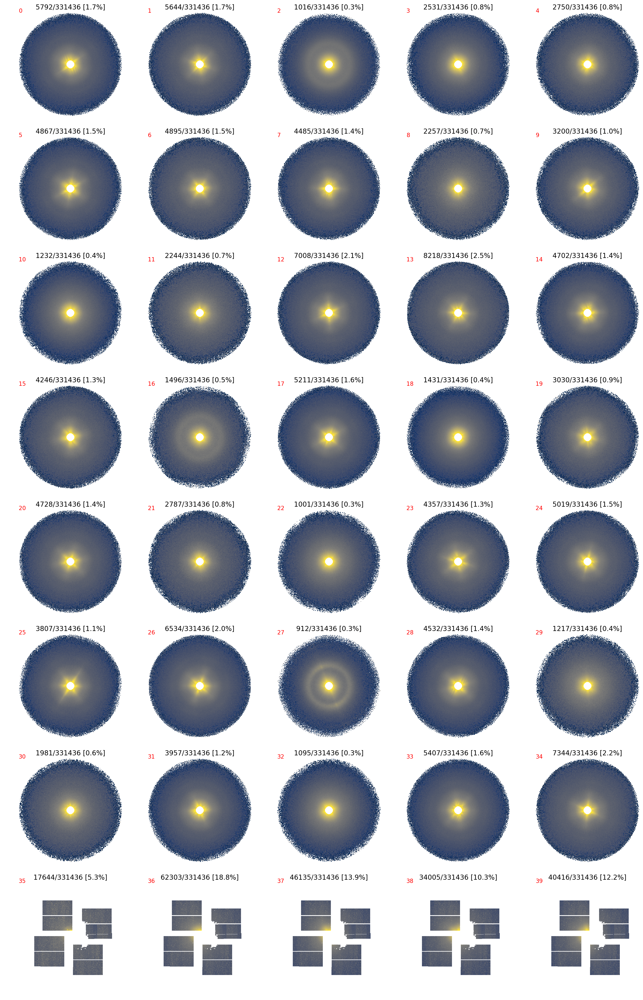

In [25]:
N = occupancies.shape[1]
ncols = 5
nrows = N//ncols
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(ncols*4,nrows*4), dpi=200)
for i in range(N):
    c,r = i//ncols, i%ncols
    axes[c,r].axis('off')
    nclass = ((modes==i) & (~blacklisted)).sum()
    axes[c,r].set_title("%d/%d [%.1f%%]" %(nclass,ndata, nclass/ndata*100.))
    axes[c,r].imshow(images[i], norm=colors.LogNorm(vmin=0.0001, vmax=3), cmap='cividis')
    axes[c,r].text(0,0, "%d" %i, color='r')
plt.savefig("../../plots/2dclasses.png", bbox_inches='tight')
plt.show()

## Static class

In [ ]:
plt.figure(figsize=(5,5), dpi=100)
plt.axis('off')
plt.imshow(images[0], norm=colors.LogNorm(vmin=0.0001, vmax=3), cmap='cividis')
plt.show()

## Check cell ids for static class

In [ ]:
m = 15
cell_ids_in_static = [((modes == m) & (cells == c)).sum() for c in range(150)]

In [ ]:
plt.figure()
plt.title("Static class occupancy")
plt.bar(range(150), cell_ids_in_static)
plt.xlabel("cell")
plt.show()

## Check frames of static class

In [ ]:
m = 15
c = 10
view_index = np.where((modes == m) & (cells <= c))[0]
views_assembled = np.array([emc.get_frame(i) for i in view_index])
views_modules = np.array([emc.get_frame(i, raw=True) for i in view_index])
views_modules = views_modules.reshape((-1,4,128,128))

In [ ]:
assembled_std = views_assembled.std(axis=0)
assembled_sum = views_assembled.sum(axis=0)
powder_std = views_modules.std(axis=0)
powder_sum = views_modules.sum(axis=0)

In [ ]:
cmap = cm.get_cmap('inferno')
cmap.set_bad('0.75')
cmap.set_under('0.0')
mimg = np.ma.masked_array(np.float64(assembled_sum), mask=1-det.mask)
mimg.data[mimg.data==0] = 1e-10
plt.figure(figsize=(14,10))
plt.axis("off")
plt.title("static class - cell %d - %d frames" %(c, len(view_index)))
plt.imshow(mimg, norm=colors.LogNorm(vmin=0.001), cmap=cmap)
plt.colorbar()
plt.savefig("../../plots/2demc_badpix_static_cell_%d.png" %(c), bbox_inches='tight')
plt.show()

## Improve the lowq mask

In [14]:
with h5py.File(emc_detector, "r") as f:
    mask = f['mask'][:].reshape((4,128,128))
new_mask = mask.copy()

In [15]:
# from cell 1
new_mask[0,107:108+1,16:107+1] = 2
new_mask[0,109,106] = 2
new_mask[0,109,108] = 2
new_mask[0,114,109] = 2
new_mask[0,116,108] = 2
new_mask[0,120,107] = 2
new_mask[0,123,104] = 2
new_mask[0,125,103] = 2
new_mask[0,125,106] = 2

In [16]:
# from cell 2
new_mask[3,125,57:58+1] = 2
new_mask[3,126,58:59+1] = 2
new_mask[3,124,42] = 2
new_mask[3,122,41:42+1] = 2
new_mask[3,114:118+1,37] = 2
new_mask[3,114:117+1,36] = 2
new_mask[3,115,35] = 2
new_mask[3,111,35] = 2
new_mask[3,109,34:36+1] = 2
new_mask[3,106:108+1,33:36+1] = 2
new_mask[3,105,34] = 2

In [17]:
# from cell 12
new_mask[3,110,35] = 2
new_mask[3,90,27] = 2
new_mask[3,68,40] = 2
new_mask[3,20,67] = 2
new_mask[3,34,116] = 2
new_mask[3,105,103] = 2

In [66]:
# bright outliers
new_mask[1,27,34] = 2
new_mask[1,45,47] = 2
new_mask[0,112,105]  = 2

In [ ]:
%matplotlib notebook
plt.figure()
plt.imshow(powder_sum[3] * (new_mask[3]==0), vmax=500)
plt.show()

In [20]:
new_detector = path_to_recons + "det/det_2145_lowq1.h5"
os.system("cp %s %s" %(emc_detector, new_detector))
with h5py.File(new_detector, "a") as f:
    f['mask'][:] = new_mask.ravel()

## Further improve the lowq mask

In [ ]:
# dead pixels from cells 0 - 10
new_mask[powder_sum == 0] = 2
# hot pixels from cells 0 - 10
#new_mask[powder_sum > 500] = 2

In [ ]:
%matplotlib inline
plt.figure()
plt.imshow(powder_sum[3] * (new_mask[3]==0), vmax=500)
plt.show()

In [ ]:
new_detector = path_to_recons + "det/det_lowq8.h5"
os.system("cp %s %s" %(emc_detector, new_detector))
with h5py.File(new_detector, "a") as f:
    f['mask'][:] = new_mask.ravel()

## Check frames of class with dots

In [26]:
m = 35
view_index = np.where((modes == m))[0]
views_assembled = np.array([emc.get_frame(i) for i in view_index])
views_modules = np.array([emc.get_frame(i, raw=True) for i in view_index])
views_modules = views_modules.reshape((-1,4,128,128))

In [27]:
assembled_std = views_assembled.std(axis=0)
assembled_sum = views_assembled.sum(axis=0)
powder_std = views_modules.std(axis=0)
powder_sum = views_modules.sum(axis=0)

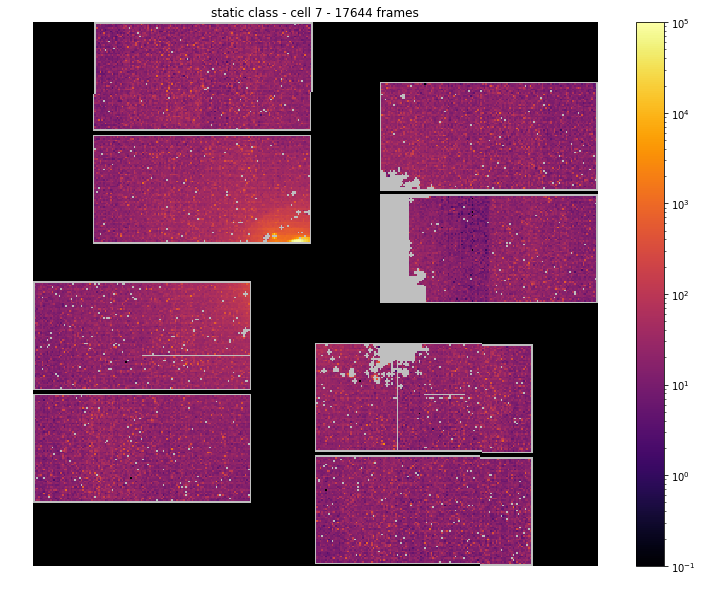

In [28]:
cmap = cm.get_cmap('inferno')
cmap.set_bad('0.75')
cmap.set_under('0.0')
mimg = np.ma.masked_array(np.float64(assembled_sum), mask=1-det.mask)
mimg.data[mimg.data==0] = 1e-10
plt.figure(figsize=(14,10))
plt.axis("off")
plt.title("static class - cell %d - %d frames" %(c, len(view_index)))
plt.imshow(mimg, norm=colors.LogNorm(vmin=0.1, vmax=1e5), cmap=cmap)
plt.colorbar()
#plt.savefig("../../plots/2demc_badpix_static_cell_%d.png" %(c), bbox_inches='tight')
plt.show()

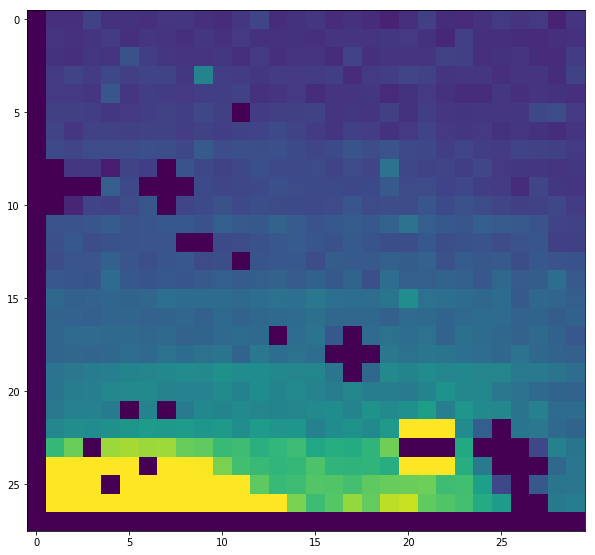

In [42]:
mod = 1
plt.figure(figsize=(10,10))
plt.imshow(powder_std[mod][100:,:30] * (det.raw_mask.reshape(4,128,128)[mod]==0)[100:,:30], vmax=0.4)
plt.show()

In [40]:
with h5py.File(emc_detector, "r") as f:
    mask = f['mask'][:].reshape((4,128,128))
new_mask = mask.copy()

In [48]:
# bad-pixels
new_mask[1,122,20:23] = 2
new_mask[1,124,20:23] = 2

In [53]:
# Halo from beam
new_mask[1,124,1:10] = 2
new_mask[1,125,1:12] = 2
new_mask[1,126,1:14] = 2

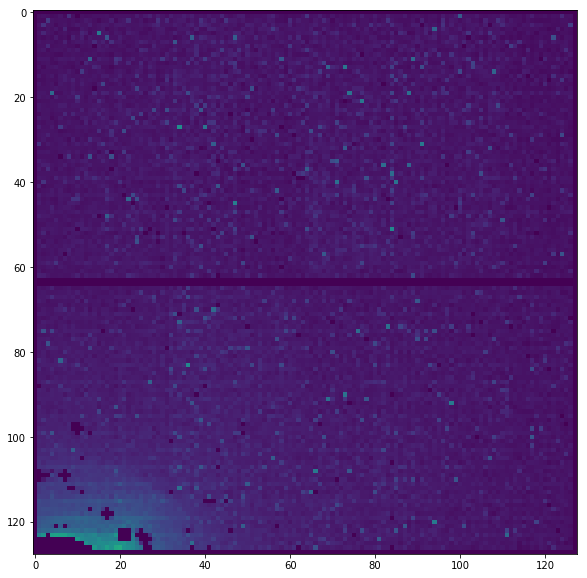

In [52]:
plt.figure(figsize=(10,10))
plt.imshow(powder_std[mod][:,:] * (new_mask[mod]==0)[:,:], vmax=0.6)
plt.show()

In [70]:
new_detector = path_to_recons + "det/det_lowq9.h5"
os.system("cp %s %s" %(emc_detector, new_detector))
with h5py.File(new_detector, "a") as f:
    f['mask'][:] = new_mask.ravel()

## Include masked values from r0597 dark analysis

In [23]:
with h5py.File(path_to_recons + "det/det_lowq9.h5", "r") as f:
    mask = f['mask'][:].reshape((4,128,128))
new_mask = mask.copy()

In [24]:
masks = []
for m in range(16):
    with h5py.File(path_to_recons + 'det/r0597/r0597_AGIPD%02d_v01_mask.h5' %m, 'r') as f:
        masks.append(np.bool8(f['mask'][:]))
masks = np.array(masks)

In [25]:
combined_mask = np.transpose(masks.all(axis=1),axes=(0,2,1))

In [26]:
new_mask[0][combined_mask[3, :,-128:]==0] = 2
new_mask[1][combined_mask[4, :,-128:]==0] = 2
new_mask[2][combined_mask[8, :,-128:]==0] = 2
new_mask[3][combined_mask[15,:,-128:]==0] = 2

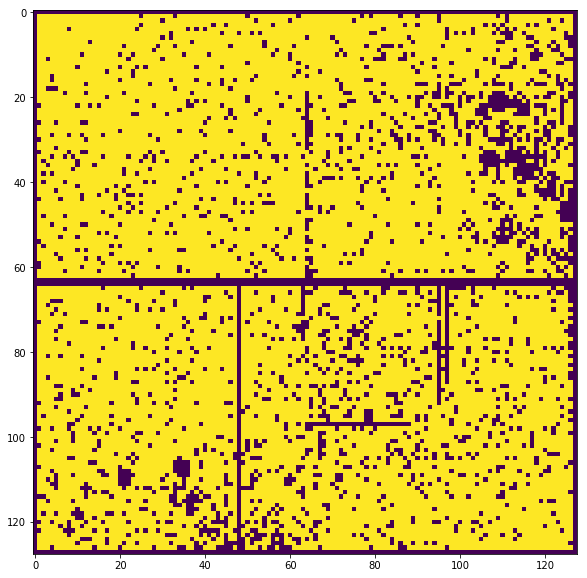

In [31]:
plt.figure(figsize=(10,10))
plt.imshow((new_mask[3]==0), vmax=None)
plt.show()

In [32]:
new_detector = path_to_recons + "det/det_lowq10.h5"
os.system("cp %s %s" %(emc_detector, new_detector))
with h5py.File(new_detector, "a") as f:
    f['mask'][:] = new_mask.ravel()